# **Домашнее задание №1 (pro)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [196]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q
!pip install phik
!pip install category_encoders -q

  Preparing metadata (setup.py) ... done


In [197]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport
import phik
import pickle
from phik import resources, report
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.linear_model import Lasso, ElasticNet, Ridge
from category_encoders.target_encoder import TargetEncoder
from sklearn.preprocessing import OneHotEncoder, FunctionTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

random.seed(42)
np.random.seed(42)

RANDOM_STATE = 42

### **Задание 0**
Для чего фиксируем сиды в домашках?

`Чтобы случайные величины имели одно и то же значение при каждом запуске ячейки`

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [198]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

df_train_raw = df_train.copy()
df_test_raw = df_test.copy()

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [x] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [x] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [x] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [x] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [199]:
display(df_train)
df_train.info()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0
6996,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


In [200]:
df_train.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque',
       'seats'],
      dtype='object')

In [201]:
display(df_test)
df_test.info()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          981 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB


In [202]:
df_train.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,202
engine,202


In [203]:
df_test.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,19
engine,19


In [204]:
df_train[df_train['mileage'].isna()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
12,Maruti Swift 1.3 VXi,2007,200000,80000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
69,Tata Indica DLS,2003,50000,70000,Diesel,Individual,Manual,First Owner,NaN,NaN,NaN,NaN,NaN
78,Maruti Swift VDI BSIV W ABS,2015,475000,78000,Diesel,Dealer,Manual,First Owner,NaN,NaN,NaN,NaN,NaN
107,Maruti Swift VDI BSIV,2010,300000,120000,Diesel,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6764,Toyota Qualis Fleet A3,2000,200000,100000,Diesel,Individual,Manual,First Owner,NaN,NaN,NaN,NaN,NaN
6889,Hyundai Santro LS zipPlus,2000,140000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
6901,Hyundai Santro Xing XS eRLX Euro III,2006,145000,80000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
6949,Ford Figo Aspire Facelift,2017,580000,165000,Diesel,Individual,Manual,First Owner,NaN,NaN,NaN,NaN,NaN


В обоих датасетах в столбцах `mileage`,	`engine`,	`max_power`,	`torque`,	`seats`присутствуют пропуски.

In [205]:
print('Количество дубликатов в df_train:', df_train.duplicated().sum())
print('Количество дубликатов в df_test:', df_test.duplicated().sum())

Количество дубликатов в df_train: 985
Количество дубликатов в df_test: 62


В обоих датасетах присутствуют явные дубликаты.

In [206]:
train_profile_report = ProfileReport(df_train, title='Pandas Profiling Report for df_train')
test_profile_report = ProfileReport(df_test, title='Pandas Profiling Report for df_test')

train_profile_report.to_file('train_profile_report.html')
test_profile_report.to_file('test_profile_report.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [207]:
train_profile_report

In [208]:
test_profile_report

In [209]:
display(df_train)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0
6996,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


**Выводы по заданию 1:**

1) В таблице train содержится 6999 наблюдений и 13 признаков. Пропуски составляют 1.1%, дубликаты 7%.

2) В таблице test содержится 1000 наблюдений и 13 признаков. Пропуски составляют 0.7%, дубликаты 3.3%.


3) В обоих датасетах пропуски сосредоточены в столбцах `mileage`,	`engine`,	`max_power`,	`torque`,	`seats`.

4) Числовые столбцы: `year`, `selling_price`, `km_driven`, `seats`.
Категориальные столбцы: `fuel`, `seller_type`, `transmission`, `owner`.
Текстовые столбцы: `name`, `mileage`, `engine`, `max_power`, `torque`.
Столбцы `mileage`, `engine`, `max_power`, `torque` можно преобразовать в числовые, чтобы добавить новые признаки.


5) Столбцы `seller_type`, `transmission`  несбалансированы. Более 80% наблюдений имеют одно значение. (частные продавцы для `seller_type`, механическая коробка передач для `transmission`).


### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [x] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [x] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [x] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [210]:
df_train.describe()

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [211]:
df_test.describe()

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [212]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [213]:
df_test.describe(include='object')

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


**Вывод по заданию 2:**

1) Среднее и медиана в обучающей и тестовой выборках примерно равны. Значит, они принадлежат одному распределению.

2) В столбцах `selling_price`,	`km_driven`,	`seats` среднее больше, чем медиана. Значит, распределение имеет жирный хвост справа.

### **Задание 3 (0.2 балла)**

- [x] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [x] Отобразите такие объекты (0.05 балла)
- [x] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [x]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [214]:
print('Количество дубликатов:', df_train.drop('selling_price', axis=1).duplicated().sum())

df_train[df_train.drop('selling_price', axis=1).duplicated()].sort_values(by=list(df_train.drop('selling_price', axis=1).columns))

Количество дубликатов: 1159


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
6704,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
1337,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
1595,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
2787,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5637,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5652,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5753,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5991,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0


In [215]:
df_train = df_train.drop_duplicates(subset=list(df_train.drop('selling_price', axis=1).columns), keep='first').reset_index(drop=True)

In [216]:
display(df_train)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [217]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [x] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [x] Приведите тип данных к ``float``.
* [x] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [218]:
for col in ['mileage', 'engine', 'max_power']:
    df_train[col] = df_train[col].str.extract(r'([\d\.]+)').astype('float')
    df_test[col] = df_test[col].str.extract(r'([\d\.]+)').astype('float')

In [219]:
def extract_torque_rpm(col):

    col = str(col)

    # Разделение строки на части
    if 'at' in col:
        parts = col.split('at')

    else:
        parts = col.split('@')

    if len(parts) == 1:
        return None, None

    torque_part = parts[0].replace(',','.').strip()
    rpm_part = parts[1].replace(',','').strip()


    # Оставим только числовые символы и разделители
    torque_part = ''.join(filter(lambda c: c.isdigit() or c == '.', torque_part))
    rpm_part = ''.join(filter(lambda c: c.isdigit() or c == '.' or c=='-' or c=='~' , rpm_part))

    # Получим значение torque с учетом единиц измерения
    if 'kgm' in str(col) or 'kg*m' in str(col):
        torque_value = float(torque_part) * 9.8
    else:
        torque_value = float(torque_part)

    # Получим значение rpm. Если указан интервал, то берем среднее
    if '-' in rpm_part:
        rpm_values = rpm_part.split('-')
        rpm_min = float(rpm_values[0])
        rpm_max = float(rpm_values[1])
        rpm_value = (rpm_min + rpm_max) / 2

    elif '~' in rpm_part:
        rpm_values = rpm_part.split('~')
        rpm_min = float(rpm_values[0])
        rpm_max = float(rpm_values[1])
        rpm_value = (rpm_min + rpm_max) / 2
    else:
        rpm_value = float(rpm_part)


    return torque_value, rpm_value

In [220]:
# Применение функции к каждому значению в столбце
train_torque = df_train['torque'].apply(extract_torque_rpm).to_list()
test_torque = df_test['torque'].apply(extract_torque_rpm).to_list()

# Создание новых столбцов
df_train['torque'] = [x[0] for x in train_torque]
df_train['rpm'] = [x[1] for x in train_torque]

df_test['torque'] = [x[0] for x in test_torque]
df_test['rpm'] = [x[1] for x in test_torque]

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [x] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [x] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [x] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - **По тренировочным данным для `train` и `test`**


 **Ответ:**

1) Медиана более устойчива к выбросам, в отличие от среднего. В случае скошенных распределений и наличии выбросов, среднее будет тянуться в сторону аномальных значений, а медиана останется почти без изменений.

2) Чтобы избежать утечки информации из тестового набора, медиана считается на обучающей выборке. Ей заполняются пропуски и в обучающей и в тестовой выборках.





In [221]:
for col in ['mileage', 'engine', 'max_power', 'torque', 'seats', 'rpm']:
  train_median = df_train[col].median()
  df_train[col] = df_train[col].fillna(train_median)
  df_test[col] = df_test[col].fillna(train_median)


In [222]:
display(df_train)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.00,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.00,5.0,2000.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.52,5.0,2250.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,112.70,5.0,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75,5.0,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.10,5.0,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90.00,5.0,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.70,5.0,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,235.20,5.0,2325.0


### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [x] Осуществите приведение столбцов к необходимому типу.
- [x] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [223]:
for col in ['engine', 'seats']:
    df_train[col] = df_train[col].astype('int')
    df_test[col] = df_test[col].astype('int')

In [224]:
df_train['seats'].value_counts()

,count
seats,
5,4618
7,800
8,191
4,94
9,68
6,48
10,18
2,2
14,1


В переменной seats всего 9 дискретных значений. Количество мест в автомобилях, как правило, стандартно. Поэтому каждое число можно рассматривать как отдельный класс.

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [x] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [225]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,238.519375,5.426712,2847.031764
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,4876.929187,0.982344,972.667797
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,14.900000,2.000000,1300.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,111.720000,5.000000,2000.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,160.000000,5.000000,2400.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,200.000000,5.000000,3750.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,372779.260000,14.000000,21800.000000


In [226]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,rpm
count,1000.000000,1.000000e+03,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.33881,1454.87600,90.841670,187.258530,5.403000,2890.841000
std,4.012149,7.585539e+05,48486.218662,3.95175,521.99574,34.893389,357.664665,0.912921,954.928129
min,1995.000000,3.100000e+04,1303.000000,0.00000,624.00000,34.200000,24.000000,4.000000,1470.000000
25%,2011.000000,2.500000e+05,37000.000000,16.55000,1197.00000,69.000000,111.700000,5.000000,2125.000000
50%,2014.000000,4.349990e+05,61500.000000,19.37000,1248.00000,82.425000,160.000000,5.000000,2400.000000
75%,2017.000000,6.700000e+05,100000.000000,22.30000,1582.00000,102.000000,205.000000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,32.26000,3604.00000,280.000000,11011.200000,9.000000,5000.000000


В обучающей выборке  из-за удаления дубликатов и заполнения пустых значений медианой в столбцах `selling_price` и `km_driven` средние значения, медиана и 1,3 квантили уменьшились.

Заполнение пропусков медианой может изменить распределение, т.к.:

1) Может возникунуть или увеличиться пик в значении, равном медиане

2) Если среднее отличается от медианы, то при заполнении пропусков оно сдвинется в сторону медианы. Также могут уменьшиться стандартное отклонение и дисперсия.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [x] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [x] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [x] Постройте pairplot по тестовым данным
- [x] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

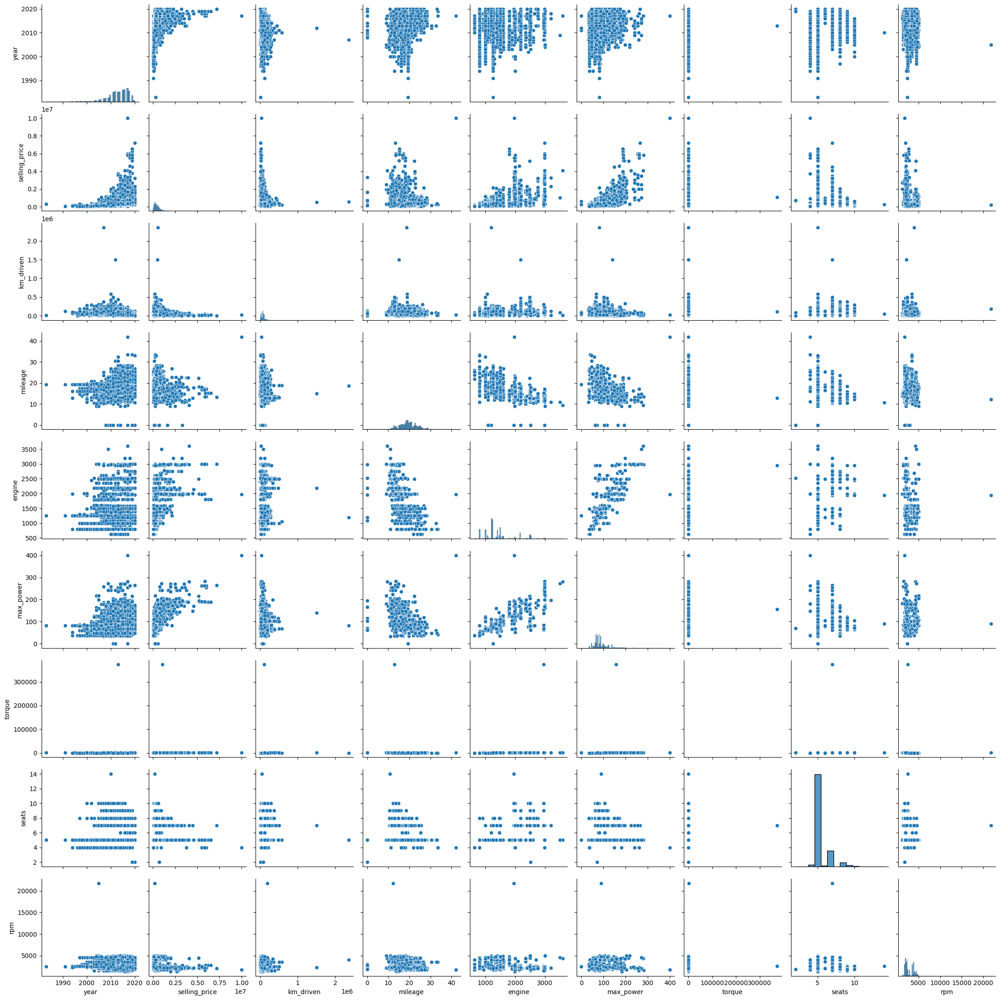

In [227]:
sns.pairplot(df_train)

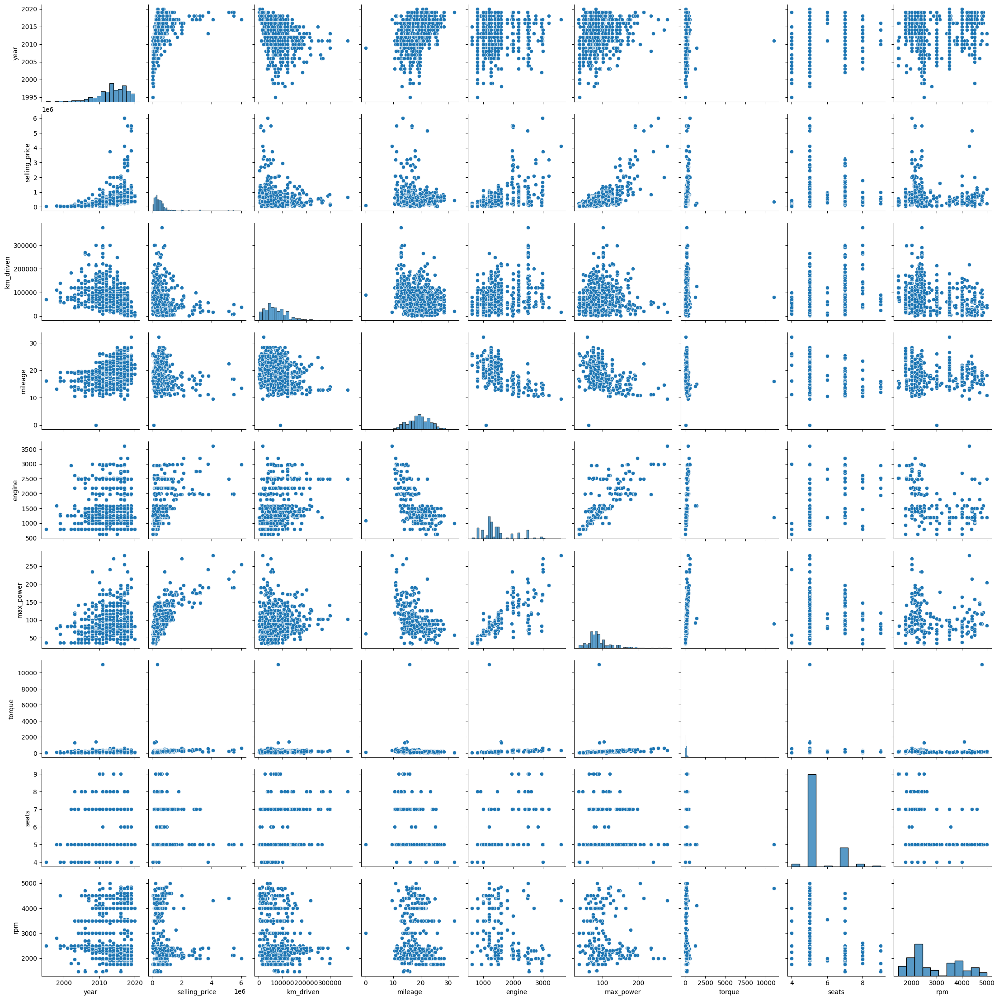

In [228]:
sns.pairplot(df_test)

Видна связь между ценой автомобиля и годом выпуска (прямая связь), обратная с пробегом (`km_driven`), прямая с мощностью и объемом двигателя. Также среди дорогих автомобилей количество сидений обычно 5 и 7.
Вероятно, положительная корреляция будет между ценой, мощностью и объемом двигателя. Это логично, т.к. более мощные автомобили обычно стоят дороже.
Также ожидается положительная корреляция между ценой и годом выпуска, а отрицательная - между ценой и пробегом (`km_driven`). Это логично, т.к. новые автомобили и автомобили с низким пробегом стоят дороже. Год выпуска и пробег будут обратно коррелировать.


Графики на тестовой выборке примерно совпадают с обучающей. Однако зависимость цены от пробега на тестовой выборке не такая явная, и распределение шире, чем в обучающей выборке. Зависимость цены от rpm также имеет более широкое распределение.


### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [x] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [x] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [229]:
num_cols = ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'rpm']

corr_train = df_train[num_cols].corr()
display(corr_train)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,rpm
year,1.000000,0.427279,-0.368966,0.341334,0.002819,0.156858,-0.000154,0.041178,0.032345
selling_price,0.427279,1.000000,-0.164828,-0.104769,0.447672,0.692814,0.023580,0.149953,-0.175812
km_driven,-0.368966,-0.164828,1.000000,-0.182086,0.229766,0.024588,0.010305,0.192328,-0.230176
mileage,0.341334,-0.104769,-0.182086,1.000000,-0.572893,-0.373390,-0.026859,-0.451059,-0.095707
engine,0.002819,0.447672,0.229766,-0.572893,1.000000,0.681117,0.054142,0.652172,-0.380245
max_power,0.156858,0.692814,0.024588,-0.373390,0.681117,1.000000,0.042512,0.244112,-0.151881
torque,-0.000154,0.023580,0.010305,-0.026859,0.054142,0.042512,1.000000,0.027945,-0.012651
seats,0.041178,0.149953,0.192328,-0.451059,0.652172,0.244112,0.027945,1.000000,-0.293622
rpm,0.032345,-0.175812,-0.230176,-0.095707,-0.380245,-0.151881,-0.012651,-0.293622,1.000000


<Axes: >

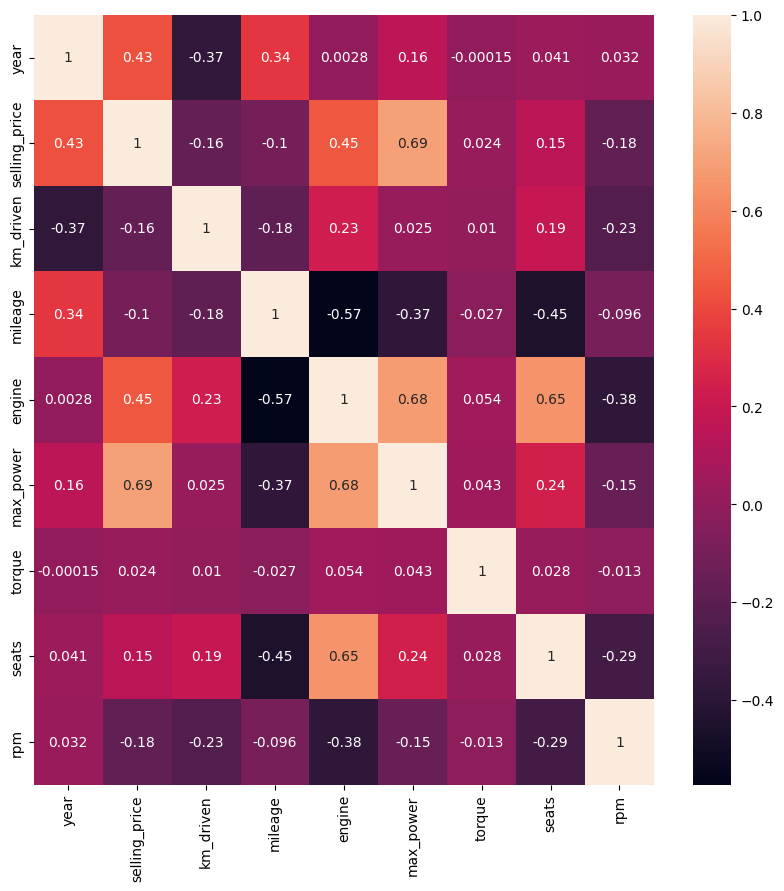

In [230]:
plt.figure(figsize=(10,10))
sns.heatmap(corr_train, annot=True)

- [x] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

1) Наибольшая корреляция (положительная) между `max_power` и `selling_price`.

2) Также положительная линейная зависимость между: максимальной мощностью (`max_power`) и объемом двигателя (`engine`) (0.68); объемом двигателя и количеством мест (0.65); ценой и годом (0.43); ценой и объемом двигателя (`engine`) (0.45); расходом топлива `mileage` и годом (0.34).

3) Да, между годом выпуска и пробегом отрицательная корреляция (-0.37). Эта зависимость объяснима, т.к. чем старше автомобиль, тем большую дистанцию он успел проехать.  



### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [x] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [x]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [x] Проинтерпретируйте результаты


Построим матрицу корреляция Спирмена с использованием готовой библиотеки.

In [231]:
sp_corr_train = df_train[num_cols].corr(method='spearman')
display(sp_corr_train)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,rpm
year,1.000000,0.707123,-0.569659,0.346132,-0.038056,0.165798,0.112925,0.048291,0.001376
selling_price,0.707123,1.000000,-0.295665,0.026186,0.463577,0.612258,0.585349,0.317605,-0.255586
km_driven,-0.569659,-0.295665,1.000000,-0.198466,0.304504,0.040919,0.235530,0.195317,-0.306868
mileage,0.346132,0.026186,-0.198466,1.000000,-0.429871,-0.308824,-0.148047,-0.435458,-0.158634
engine,-0.038056,0.463577,0.304504,-0.429871,1.000000,0.713113,0.832566,0.527716,-0.468174
max_power,0.165798,0.612258,0.040919,-0.308824,0.713113,1.000000,0.771267,0.304857,-0.151840
torque,0.112925,0.585349,0.235530,-0.148047,0.832566,0.771267,1.000000,0.436005,-0.652692
seats,0.048291,0.317605,0.195317,-0.435458,0.527716,0.304857,0.436005,1.000000,-0.309714
rpm,0.001376,-0.255586,-0.306868,-0.158634,-0.468174,-0.151840,-0.652692,-0.309714,1.000000


<Axes: >

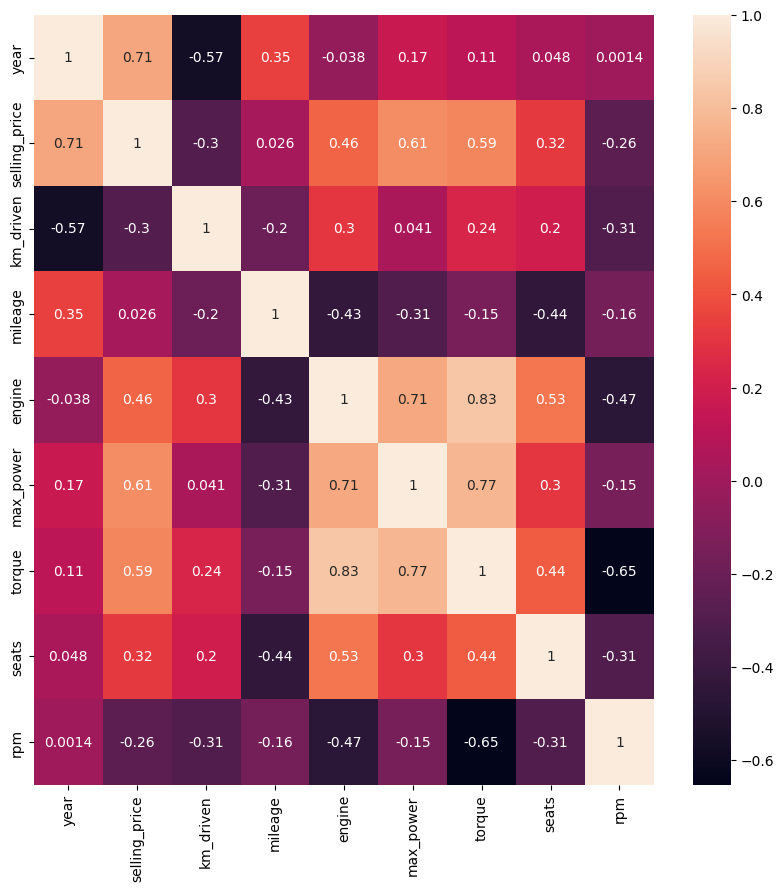

In [232]:
plt.figure(figsize=(10,10))
sns.heatmap(sp_corr_train, annot=True)

In [233]:
# Напишем функцию для подсчета корреляции между двумя столбцами
def spearman_corr(col1, col2):
    col1_rank = col1.argsort().argsort() + 1
    col2_rank = col2.argsort().argsort() + 1

    n = len(col1)
    res = 1 - 6 * np.sum((col1_rank - col2_rank)**2) / (n**3 - n)

    return res


# Создадим пустую таблицу и заполним ее значениями корреляции
sp_corr_new = pd.DataFrame(index=df_train[num_cols].columns, columns=df_train[num_cols].columns)

for i in range(len(sp_corr_new)):
    for j in range(i, len(sp_corr_new)):
        col1 = sp_corr_new.index[i]
        col2 = sp_corr_new.columns[j]

        corr_value = spearman_corr(df_train[col1].values, df_train[col2].values)
        sp_corr_new.at[col1, col2] = corr_value
        sp_corr_new.at[col2, col1] = corr_value

display(sp_corr_new)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,rpm
year,1.0,0.70506,-0.566218,0.34296,-0.034677,0.166875,0.115563,0.050485,-0.001495
selling_price,0.70506,1.0,-0.295699,0.026164,0.461866,0.612352,0.585158,0.22067,-0.255194
km_driven,-0.566218,-0.295699,1.0,-0.197687,0.303411,0.040464,0.233895,0.105454,-0.30598
mileage,0.34296,0.026164,-0.197687,1.0,-0.428987,-0.308684,-0.148214,-0.307221,-0.156069
engine,-0.034677,0.461866,0.303411,-0.428987,1.0,0.711526,0.830412,0.36166,-0.46638
max_power,0.166875,0.612352,0.040464,-0.308684,0.711526,1.0,0.770354,0.200687,-0.152729
torque,0.115563,0.585158,0.233895,-0.148214,0.830412,0.770354,1.0,0.286674,-0.650782
seats,0.050485,0.22067,0.105454,-0.307221,0.36166,0.200687,0.286674,1.0,-0.209283
rpm,-0.001495,-0.255194,-0.30598,-0.156069,-0.46638,-0.152729,-0.650782,-0.209283,1.0


Результаты библиотечного и вручную написанного рассчета совпадают.

Изучим корреляцию phik.

In [234]:
corr_phik = df_train.phik_matrix()
display(corr_phik)

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'rpm']


/usr/local/lib/python3.10/dist-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,rpm
name,1.000000,0.948995,0.994871,0.000000,1.000000,0.799127,1.000000,0.830098,0.999690,1.000000,0.997906,1.000000,0.999985,0.999982
year,0.948995,1.000000,0.219841,0.081574,0.205834,0.232412,0.153714,0.418636,0.279253,0.213156,0.381639,0.000000,0.288178,0.250207
selling_price,0.994871,0.219841,1.000000,0.000000,0.157885,0.334505,0.463058,0.557641,0.649768,0.503682,0.872166,0.040497,0.196447,0.241560
km_driven,0.000000,0.081574,0.000000,1.000000,0.046285,0.000000,0.012824,0.087887,0.081625,0.210747,0.000000,0.000000,0.096223,0.047207
fuel,1.000000,0.205834,0.157885,0.046285,1.000000,0.050771,0.053721,0.030943,0.582304,0.644421,0.236006,0.000000,0.450714,0.557492
seller_type,0.799127,0.232412,0.334505,0.000000,0.050771,1.000000,0.127968,0.176612,0.064736,0.160346,0.331904,0.000000,0.032173,0.136842
transmission,1.000000,0.153714,0.463058,0.012824,0.053721,0.127968,1.000000,0.096990,0.331889,0.520161,0.511877,0.022241,0.045734,0.015786
owner,0.830098,0.418636,0.557641,0.087887,0.030943,0.176612,0.096990,1.000000,0.152406,0.186011,0.121438,0.029999,0.046741,0.097950
mileage,0.999690,0.279253,0.649768,0.081625,0.582304,0.064736,0.331889,0.152406,1.000000,0.588155,0.687235,0.000000,0.679979,0.320625
engine,1.000000,0.213156,0.503682,0.210747,0.644421,0.160346,0.520161,0.186011,0.588155,1.000000,0.720780,0.122578,0.603400,0.635459


In [235]:
display(df_train)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.00,5,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.00,5,2000.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.52,5,2250.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.70,5,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.75,5,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,96.10,5,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,90.00,5,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,113.70,5,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,235.20,5,2325.0


<Axes: >

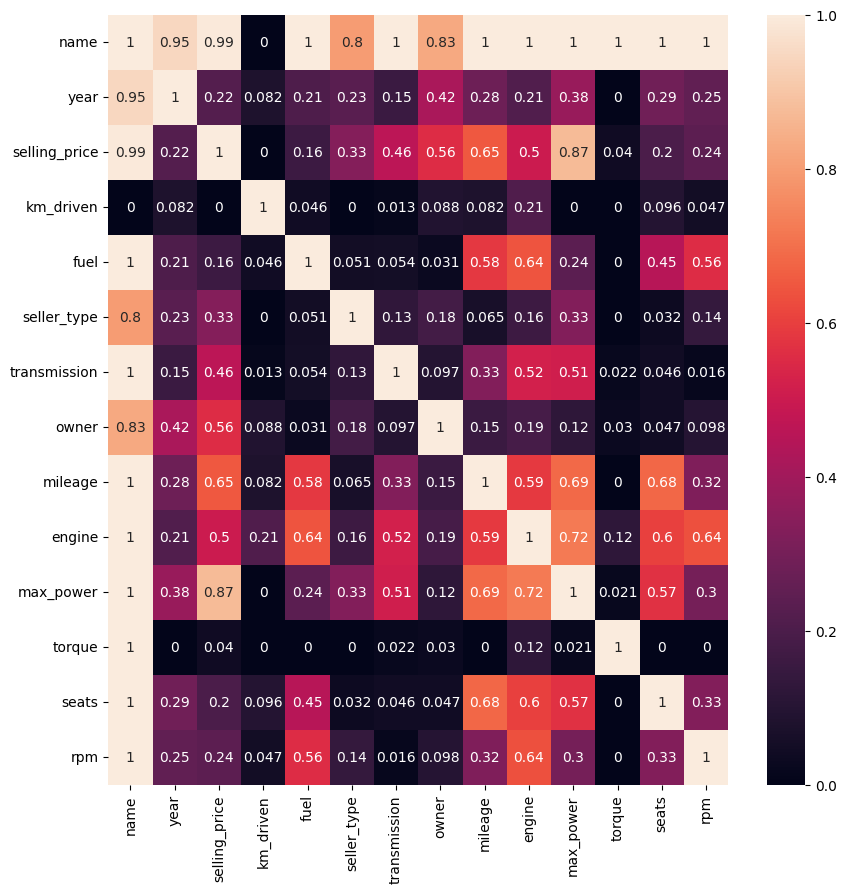

In [236]:
plt.figure(figsize=(10,10))
sns.heatmap(corr_phik, annot=True)

Вывод:

1) Поле `name` почти 100%-но коррелирует со всеми полями, кроме `km_driven`, `seller_type` и `owner`. Это логично, т.к. модели автомобилей выпускаются в один год и имеют одинаковые характеристики. Корреляция с `seller_type` и `owner` также высокая (> 0.8), в зависимости от модели и поколения автомобиля, можно предположить, сколько у него было владельцев и продается ли он частым продавцом или дилером.

2) Среди остальных показателей самая высокая корреляция между мощностью и ценой (0.87). Также высокая корреляция между мощностью, объемом двигателя, расходом топлива, типом трансмиссии, количеством мест.

3) Вид топлива, количество мест, оборотов, объем двигателя и расход  топлива также связаны. Это логично, т.к. крупные автомобили с большим числом мест(микроавтобусы и т.д.) чаще потребляют дизельное топливо, имеют больший объем двигателя и расход топлива.

4) Исходя из phik-корреляции, сильной связи между ценой, годом выпуска и пробегом нет.

### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

In [237]:
# your code here

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [238]:
df_train_num = df_train[num_cols].copy()

df_test_num = df_test[num_cols].copy()

In [239]:
y_train = df_train_num['selling_price']
X_train = df_train_num.drop('selling_price', axis=1)

y_test = df_test_num['selling_price']
X_test = df_test_num.drop('selling_price', axis=1)

In [240]:
X_train.shape

(5840, 8)

In [241]:
# Столбец torque обработан, поэтому столбцов 8, а не 6

#assert X_train.shape == (5840, 6)

In [242]:
X_train, X_val, y_train, y_val= train_test_split(X_train, y_train, test_size=1000, random_state=42)

In [243]:
X_val.shape

(1000, 8)

In [244]:
# Столбец torque обработан, поэтому столбцов 8, а не 6
# assert X_test.shape == (1000, 6)

In [245]:
display(df_train_num)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,rpm
0,2014,450000,145500,23.40,1248,74.00,190.00,5,2000.0
1,2014,370000,120000,21.14,1498,103.52,250.00,5,2000.0
2,2010,225000,127000,23.00,1396,90.00,219.52,5,2250.0
3,2007,130000,120000,16.10,1298,88.20,112.70,5,4500.0
4,2017,440000,45000,20.14,1197,81.86,113.75,5,4000.0
...,...,...,...,...,...,...,...,...,...
5835,2008,120000,191000,17.92,1086,62.10,96.10,5,3000.0
5836,2013,260000,50000,18.90,998,67.10,90.00,5,3500.0
5837,2013,320000,110000,18.50,1197,82.85,113.70,5,4000.0
5838,2007,135000,119000,16.80,1493,110.00,235.20,5,2325.0


### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [x] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [x] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [246]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr1 = LinearRegression()
lr1.fit(X_train, y_train)

pred_train_1 = lr1.predict(X_train)
pred_val_1 = lr1.predict(X_val)
pred_test_1 = lr1.predict(X_test)

print('R2 на обучающей выборке:', r2_score(y_train, pred_train_1))
print('R2 на валидационной выборке:', r2_score(y_val, pred_val_1))
print('R2 на тестовой выборке:', r2_score(y_test, pred_test_1))

print('MSE на обучающей выборке:', MSE(y_train, pred_train_1))
print('MSE на валидационной выборке:', MSE(y_val, pred_val_1))
print('MSE на тестовой выборке:', MSE(y_test, pred_test_1))


R2 на обучающей выборке: 0.609951742844178
R2 на валидационной выборке: 0.5500583274999573
R2 на тестовой выборке: 0.5928922092619321
MSE на обучающей выборке: 102682286813.68538
MSE на валидационной выборке: 179701533772.3303
MSE на тестовой выборке: 234017183339.1216


In [247]:
print(lr1.coef_)

[ 4.00982867e+04 -1.44159393e+00 -6.47726563e+03  6.91272427e+01
  9.33303834e+03 -3.39365953e-01 -3.87741975e+04 -7.93815407e+01]


По метрике R^2 видно, что модель неплохо объясняет данные. По MSE сложно понять, насколько точна модель из-за квадратных единиц измерения.
Значение обеих метрик на валидационной и на тестовой выборках ухудшилось, это нормально.

### **Задание 13 (0.15 балла)**

- [x] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [248]:
def r_square(y_true, y_pred):
    ssr = np.mean(np.square(y_true - y_pred))
    sst = np.mean(np.square(y_true - np.mean(y_true)))

    res = 1 - (ssr/sst)
    return res

In [249]:
print('R2 на обучающей выборке:', r_square(y_train, pred_train_1))
print('R2 на валидационной выборке:', r_square(y_val, pred_val_1))
print('R2 на тестовой выборке:', r_square(y_test, pred_test_1))

R2 на обучающей выборке: 0.609951742844178
R2 на валидационной выборке: 0.5500583274999573
R2 на тестовой выборке: 0.5928922092619321


Результаты совпадают с библиотечным вариантом.

(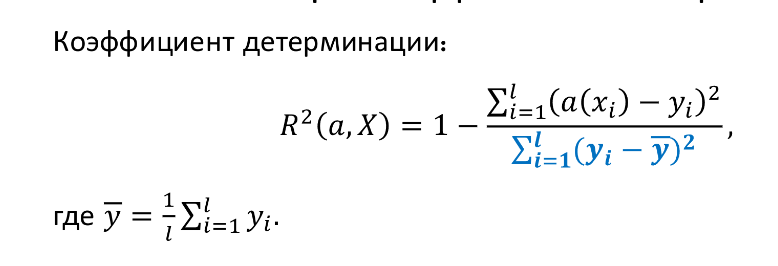)


Числитель - это дисперсия, не объясняемая моделью. Знаменатель - общая дисперсия. Соответственно, дробь - это доля необъясненной дисперсии.
Коэффициент детерминации - доля объясненной моделью дисперсии.

### **Бонус (0.15 балла)**

- [x] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [x] Объясните, когда применяется $\text{adjusted}-R^2$?

In [250]:
def adjusted_r_squared(y_true, y_pred, k_features):
    r_squared = r_square(y_true, y_pred)
    n = len(y_true)

    return 1 - ((1 - r_squared) * (n - 1)) / (n - k_features)

adjusted-R^2 штрафует за дополнительно включенные признаки, поэтому его можно использовать для сравнения моделей с разным количеством признаков.

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [x] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [251]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

lr2 = LinearRegression()
lr2.fit(X_train_scaled, y_train)

pred_train_2 = lr2.predict(X_train_scaled)
pred_val_2 = lr2.predict(X_val_scaled)
pred_test_2 = lr2.predict(X_test_scaled)

print('R2 на обучающей выборке:', r2_score(y_train, pred_train_2))
print('R2 на валидационной выборке:', r2_score(y_val, pred_val_2))
print('R2 на тестовой выборке:', r2_score(y_test, pred_test_2))

print('MSE на обучающей выборке:', MSE(y_train, pred_train_2))
print('MSE на валидационной выборке:', MSE(y_val, pred_val_2))
print('MSE на тестовой выборке:', MSE(y_test, pred_test_2))

R2 на обучающей выборке: 0.609951742844179
R2 на валидационной выборке: 0.550058327499964
R2 на тестовой выборке: 0.5928922092619553
MSE на обучающей выборке: 102682286813.68512
MSE на валидационной выборке: 179701533772.3276
MSE на тестовой выборке: 234017183339.10834


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [x] Какой признак оказался наиболее информативным в предсказании цены?

In [252]:
display((pd.DataFrame(index=X_train_scaled.columns, data=lr2.coef_, columns=['coeff'])).sort_values(by='coeff', key=lambda col: abs(col), ascending=False))

,coeff
max_power,293676.236052
year,162785.365212
rpm,-74772.095730
km_driven,-70692.394810
seats,-37979.194602
engine,33605.163262
mileage,-25911.496170
torque,-1817.767872


Наиболее информативный признак - мощность двигателя.

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [x] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [x] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [253]:
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

pred_train_lasso = lasso.predict(X_train_scaled)
pred_val_lasso = lasso.predict(X_val_scaled)
pred_test_lasso = lasso.predict(X_test_scaled)

print('R2 на обучающей выборке:', r2_score(y_train, pred_train_lasso))
print('R2 на валидационной выборке:', r2_score(y_val, pred_val_lasso))
print('R2 на тестовой выборке:', r2_score(y_test, pred_test_lasso))

print('MSE на обучающей выборке:', MSE(y_train, pred_train_lasso))
print('MSE на валидационной выборке:', MSE(y_val, pred_val_lasso))
print('MSE на тестовой выборке:', MSE(y_test, pred_test_lasso))

R2 на обучающей выборке: 0.6099517427903092
R2 на валидационной выборке: 0.5500603520396203
R2 на тестовой выборке: 0.5928909904049662
MSE на обучающей выборке: 102682286827.86661
MSE на валидационной выборке: 179700725194.45258
MSE на тестовой выборке: 234017883972.9109


In [254]:
display((pd.DataFrame(index=X_train_scaled.columns, data=lasso.coef_, columns=['coeff'])).sort_values(by='coeff', key=lambda col: abs(col), ascending=False))

,coeff
max_power,293677.539236
year,162783.425415
rpm,-74769.784563
km_driven,-70691.187892
seats,-37975.261079
engine,33603.026093
mileage,-25908.318768
torque,-1816.714047


Метрики и коэффициенты практически не изменились.
Скорее всего, это связано с тем, что мы не настроили коэффициент регуляризации и использовали дефолтное значение. Либо все признаки действительно важны, поэтому ни один коэффициент не занулился.

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [x] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [x] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [255]:
y_train_all = df_train_num['selling_price']
X_train_all = df_train_num.drop('selling_price', axis=1)

# y_test = df_test_num['selling_price']
# X_test = df_test_num.drop('selling_price', axis=1)

scaler = StandardScaler()

X_train_all = pd.DataFrame(scaler.fit_transform(X_train_all), columns=X_train_all.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

folds = StratifiedKFold(n_splits=10,  shuffle=True, random_state=RANDOM_STATE)

In [256]:
param_grid_lasso = {
                # 'alpha': [0, 0.01, 0.1, 1.0, 10.0, 100.0, 1e3, 1e4, 1e5, 1e6]
                'alpha': np.arange(1000, 100000, 1000)
                }
lasso_2 = Lasso()
grid_search_lasso = GridSearchCV(lasso_2,
                  param_grid=param_grid_lasso,
                  scoring=['neg_mean_squared_error','r2'],
                  refit='r2',
                  cv=folds,
                  return_train_score=True,
                  n_jobs=-1,
                  verbose=3)
grid_search_lasso.fit(X_train_all,y_train_all)

Fitting 10 folds for each of 99 candidates, totalling 990 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([ 1000,  2000,  3000,  4000,  5000,  6000,  7000,  8000,  9000,
       10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000,
       19000, 20000, 21000, 22000, 23000, 24000, 25000, 26000, 27000,
       28000, 29000, 30000, 31000, 32000, 33000, 34000, 35000, 36000,
       37000, 38000, 39...
       55000, 56000, 57000, 58000, 59000, 60000, 61000, 62000, 63000,
       64000, 65000, 66000, 67000, 68000, 69000, 70000, 71000, 72000,
       73000, 74000, 75000, 76000, 77000, 78000, 79000, 80000, 81000,
       82000, 83000, 84000, 85000, 86000, 87000, 88000, 89000, 90000,
       91000, 92000, 93000, 94000, 95000, 96000, 97000, 98000, 99000])},
             refit='r2', return_train_score=True,
             scoring=['neg_mean_squared_error', 'r2'], verbose=3)

In [257]:
print('Лучшие параметры:', grid_search_lasso.best_params_)

best_index_r2 = grid_search_lasso.cv_results_['rank_test_r2'] == 1

mean_squared_error_best = grid_search_lasso.cv_results_['mean_test_neg_mean_squared_error'][best_index_r2]
r2_best = grid_search_lasso.cv_results_['mean_test_r2'][best_index_r2]

lasso_best = grid_search_lasso.best_estimator_
pred_test_lasso_2 = lasso_best.predict(X_test_scaled)

print(f'R2 на кросс-валидации: {r2_best[0]}')
print('R2 на тестовой выборке:', r2_score(y_test, pred_test_lasso_2))
print(f'MSE на кросс-валидации: {-mean_squared_error_best[0]}')
print('MSE на тестовой выборке:', MSE(y_test, pred_test_lasso_2))

Лучшие параметры: {'alpha': 14000}
R2 на кросс-валидации: 0.5995413195581264
R2 на тестовой выборке: 0.5814240683970548
MSE на кросс-валидации: 116780968423.13004
MSE на тестовой выборке: 240609398188.33725


In [258]:
display((pd.DataFrame(index=X_train_all.columns, data=lasso_best.coef_, columns=['coeff'])).sort_values(by='coeff', key=lambda col: abs(col), ascending=False))

,coeff
max_power,327446.325019
year,151334.684739
rpm,-43694.789845
km_driven,-36518.293368
mileage,0.000000
engine,0.000000
torque,-0.000000
seats,-0.000000


GridSearchCV перебирает все возможные значения параметров из сетки + проводит кросс-валидацию. Общее число моделей = количество фолдов * кол-во значений параметра 1 * кол-во значений  параметра 2 * ... и т.д.
В нашем случае параметр alpha принимает 99 значений, кросс-валидация проводится на 10 фолдах, значит всего построено 990 моделей.

Alpha - коэффициент L1-регуляризации. Чем он больше, тем большую роль играет регуляризация.
Лучшее качество модели получили при alpha=14000, при этом занулились веса у `mileage`, `engine`, `torque`, `seats`.

**Ваша задача 2:**

- [x] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [x] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [259]:
param_grid_elastic = {
                'alpha': np.arange(0, 1, 0.05),
                'l1_ratio': np.arange(0, 1, 0.05)
            }
elastic = ElasticNet(random_state=RANDOM_STATE)

grid_search_elastic = GridSearchCV(elastic,
                  param_grid=param_grid_elastic,
                  scoring=['neg_mean_squared_error','r2'],
                  refit='r2',
                  cv=folds,
                  return_train_score=True,
                  n_jobs=-1,
                  verbose=3)
grid_search_elastic.fit(X_train_all,y_train_all)

Fitting 10 folds for each of 400 candidates, totalling 4000 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=ElasticNet(random_state=42), n_jobs=-1,
             param_grid={'alpha': array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95]),
                         'l1_ratio': array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95])},
             refit='r2', return_train_score=True,
             scoring=['neg_mean_squared_error', 'r2'], verbose=3)

In [260]:
print('Лучшие параметры:', grid_search_elastic.best_params_)

best_index_r2 = grid_search_elastic.cv_results_['rank_test_r2'] == 1

mean_squared_error_best = grid_search_elastic.cv_results_['mean_test_neg_mean_squared_error'][best_index_r2]
r2_best = grid_search_elastic.cv_results_['mean_test_r2'][best_index_r2]

elastic_best = grid_search_elastic.best_estimator_
pred_test_elastic = elastic_best.predict(X_test_scaled)

print(f'R2 на кросс-валидации: {r2_best[0]}')
print('R2 на тестовой выборке:', r2_score(y_test, pred_test_elastic))
print(f'MSE на кросс-валидации: {-mean_squared_error_best[0]}')
print('MSE на тестовой выборке:', MSE(y_test, pred_test_elastic))

Лучшие параметры: {'alpha': 0.55, 'l1_ratio': 0.9}
R2 на кросс-валидации: 0.5987489217365998
R2 на тестовой выборке: 0.5870123477943772
MSE на кросс-валидации: 116965398121.4711
MSE на тестовой выборке: 237397095613.87036


In [261]:
display((pd.DataFrame(index=X_train_all.columns, data=elastic_best.coef_, columns=['coeff'])).sort_values(by='coeff', key=lambda col: abs(col), ascending=False))

,coeff
max_power,299993.800874
year,158209.587170
rpm,-56196.928100
km_driven,-51356.042780
engine,43316.085385
seats,-33840.174522
mileage,-3130.215062
torque,-1677.112771


Перебирали по 20 вариантов параметров `alpha` и `l1_ratio`. Всего было обучено 10 (фолдов) * 20 (alpha) * 20 (l1_ratio) = 4000 моделей. Наиболее подходящии параметры: alpha=0.55, l1_ratio=0.9.

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [262]:
# your code here

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [x] Предобработайте столбец `name`, чтобы избежать его удаления

In [263]:
X_train_cat = df_train.drop('selling_price', axis=1)
y_train_cat = df_train['selling_price']


X_test_cat = df_test.drop('selling_price', axis=1)
y_test_cat = df_test['selling_price']

In [264]:
target_encoder = TargetEncoder(cols=['name'])
X_train_cat = target_encoder.fit_transform(X_train_cat, y_train_cat)
X_test_cat = target_encoder.transform(X_test_cat)

scaler = StandardScaler()
num_cols = ['name', 'year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'rpm']

X_train_cat[num_cols] = scaler.fit_transform(X_train_cat[num_cols])
X_test_cat[num_cols] = scaler.transform(X_test_cat[num_cols])

In [265]:
#Столбец torque предобрабатывали
# assert X_train_cat.shape == (5840, 11)

In [266]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


### **Задание 20 (0.1 балла)**

- [x] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [267]:
cat_cols = ['fuel', 'seller_type', 'transmission', 'owner', 'seats']

ohe = OneHotEncoder(handle_unknown='ignore')


X_train_ohe = ohe.fit_transform(X_train_cat[cat_cols]).toarray()
X_test_ohe = ohe.transform(X_test_cat[cat_cols]).toarray()

column_names = []
for i, categories in enumerate(ohe.categories_):
    column_names.extend([f"{cat_cols[i]}_{category}" for category in categories])

X_train_ohe = pd.DataFrame(X_train_ohe, columns=column_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=column_names)


X_train_cat = pd.concat([X_train_cat.drop(cat_cols, axis=1), X_train_ohe], axis=1)
X_test_cat = pd.concat([X_test_cat.drop(cat_cols, axis=1), X_test_ohe], axis=1)

cols_to_del = ['fuel_CNG', 'seller_type_Dealer', 'transmission_Automatic', 'owner_First Owner', 'seats_2']

for col in cols_to_del:
    X_train_cat = X_train_cat.drop(col, axis=1)
    X_test_cat = X_test_cat.drop(col, axis=1)

In [268]:
display(X_train_cat)

,name,year,km_driven,mileage,engine,max_power,torque,rpm,fuel_Diesel,fuel_LPG,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,0.745129,0.139570,1.191152,0.995867,-0.373643,-0.439550,-0.009950,-0.870908,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.209578,0.139570,0.766619,0.428830,0.141162,0.493513,0.002354,-0.870908,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.166525,-0.837167,0.883158,0.895506,-0.068879,0.066175,-0.003896,-0.613861,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.294963,-1.569719,0.766619,-0.835712,-0.270682,0.009281,-0.025801,1.699563,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.117417,0.872122,-0.482007,0.177929,-0.478663,-0.191113,-0.025586,1.185468,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,-1.532457,-1.325535,1.948653,-0.379072,-0.707236,-0.815684,-0.029205,0.157280,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5836,-0.172583,-0.104614,-0.398765,-0.133189,-0.888447,-0.657645,-0.030456,0.671374,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5837,-0.485275,-0.104614,0.600136,-0.233549,-0.478663,-0.159821,-0.025596,1.185468,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5838,-0.444332,-1.569719,0.749971,-0.660081,0.130865,0.698332,-0.000681,-0.536747,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

1) OHE следует использовать, когда категорий не слишком много, иначе количество признаков резко вырастет, и модель может недообучиться.

2) Необходимо удалять один из полученных столбцов, т.к. значение 0 во всех остальных итак будет указывать на 1 в этом столбце. Он не дает новой информации, но увеличивает вычислительную нагрузку и создает мультиколлинеарность.

3) Некорректно. При удалении столбцов мы лишимся информации о категории, которую удалили при применении OneHotEncoding, т.к. ее значение определялось по совокупности всех остальных категорий.

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [x] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [x] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [269]:
param_grid_ridge = {
                # 'alpha': [0, 0.01, 0.1, 1.0, 10.0, 100.0, 1e3, 1e4, 1e5, 1e6]
                'alpha': np.arange(10, 1000, 10)
                }
ridge = Ridge(random_state=RANDOM_STATE)

grid_search_ridge = GridSearchCV(ridge,
                  param_grid=param_grid_ridge,
                  scoring=['neg_mean_squared_error','r2'],
                  refit='r2',
                  cv=folds,
                  return_train_score=True,
                  n_jobs=-1,
                  verbose=3)
grid_search_ridge.fit(X_train_cat,y_train_cat)

Fitting 10 folds for each of 99 candidates, totalling 990 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Ridge(random_state=42), n_jobs=-1,
             param_grid={'alpha': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130,
       140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260,
       270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390,
       400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510, 520,
       530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640, 650,
       660, 670, 680, 690, 700, 710, 720, 730, 740, 750, 760, 770, 780,
       790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900, 910,
       920, 930, 940, 950, 960, 970, 980, 990])},
             refit='r2', return_train_score=True,
             scoring=['neg_mean_squared_error', 'r2'], verbose=3)

In [270]:
print('Лучшие параметры:', grid_search_ridge.best_params_)

best_index_r2 = grid_search_ridge.cv_results_['rank_test_r2'] == 1

mean_squared_error_best = grid_search_ridge.cv_results_['mean_test_neg_mean_squared_error'][best_index_r2]
r2_best = grid_search_ridge.cv_results_['mean_test_r2'][best_index_r2]

ridge_best = grid_search_ridge.best_estimator_
pred_test_ridge = ridge_best.predict(X_test_cat)

print(f'R2 на кросс-валидации: {r2_best[0]}')
print('R2 на тестовой выборке:', r2_score(y_test_cat, pred_test_ridge))
print(f'MSE на кросс-валидации: {-mean_squared_error_best[0]}')
print('MSE на тестовой выборке:', MSE(y_test_cat, pred_test_ridge))

Лучшие параметры: {'alpha': 40}
R2 на кросс-валидации: 0.7460903637751312
R2 на тестовой выборке: 0.7559487786058522
MSE на кросс-валидации: 70523876732.46936
MSE на тестовой выборке: 140287611095.7962


После добавления категориальных признаков качество модели резко выросло и составило 0.746 на кросс-валидации и 0.756 на тестовой выборке (R^2).

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

1) Очистим столбцы `selling_price`, `km_driven`, `mileage`, `engine	`, `max_power`, `torque`, `rpm` от выбросов (выбросы заменим на медиану).

In [271]:
# df_train_fe = df_train.copy()
# df_test_fe = df_test.copy()


In [272]:
# def replace_outliers_with_median(df, column):
#     # Рассчитываем квартили и IQR
#     Q1 = df[column].quantile(0.25)
#     Q3 = df[column].quantile(0.75)
#     IQR = Q3 - Q1

#     # Определяем границы выбросов
#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR

#     # Замена выбросов на медиану
#     median = df[column].median()
#     df.loc[(df[column] < lower_bound) | (df[column] > upper_bound), column] = median

#     return df

# for col in ['selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'rpm']:
#     replace_outliers_with_median(df_train_fe, col)


Попробовал, качество стало хуже :(

2) В полях `fuel`, `seller_type`, `owner`, `seats` есть мелкие категории, объединим их.

In [273]:
# print(df_train_fe['fuel'].unique())
# df_train_fe.loc[(df_train_fe['fuel']=='LPG') | (df_train_fe['fuel']=='CNG'), 'fuel'] = 'Else'
# print(df_train_fe['fuel'].unique())

In [274]:
# print(df_train_fe['seats'].unique())
# df_train_fe.loc[(df_train_fe['seats']<=6), 'seats'] = 6
# df_train_fe.loc[(df_train_fe['seats']>6), 'seats'] = 7
# print(df_train_fe['seats'].unique())

In [275]:
# print(df_train_fe['seller_type'].unique())
# df_train_fe.loc[(df_train_fe['seller_type']=='Trustmark Dealer'), 'seller_type'] = 'Dealer'
# print(df_train_fe['seller_type'].unique())

In [276]:
# print(df_train_fe['owner'].unique())
# df_train_fe.loc[((df_train_fe['owner']=='Third Owner') |
#   (df_train_fe['owner']=='Fourth & Above Owner') |
#   (df_train_fe['owner']=='Test Drive Car')), 'owner'] = 'Else'
# print(df_train_fe['owner'].unique())

Попробовал, качество стало хуже :(

3) Столбцы `year`, `km_driven` нелинейно зависят от стоимости. Возведем их в квадрат.

In [277]:
# df_train_fe['year'] = df_train_fe['year']**2
# df_train_fe['km_driven'] = df_train_fe['km_driven']**2

# df_test['year'] = df_test['year']**2
# df_test['km_driven'] = df_test['km_driven']**2


Попробовал, качество стало хуже :(

4) Добавим дополнительный признак: мощность/объем

In [278]:
# df_train_fe['specific_power'] = df_train_fe['max_power']/df_train_fe['engine']
# df_test_fe['specific_power'] = df_test_fe['max_power']/df_test_fe['engine']

# df_train_fe = df_train_fe.drop(['max_power', 'engine'], axis=1)
# df_test_fe = df_test_fe.drop(['max_power', 'engine'], axis=1)

Попробовал, качество стало хуже :(

Проверим на модели

In [279]:
# X_train_new = df_train_fe.drop('selling_price', axis=1)
# y_train_new = df_train_fe['selling_price']


# X_test_new = df_test_fe.drop('selling_price', axis=1)
# y_test_new = df_test_fe['selling_price']

# target_encoder = TargetEncoder(cols=['name'])
# X_train_new = target_encoder.fit_transform(X_train_new, y_train_new)
# X_test_new = target_encoder.transform(X_test_new)

# scaler = StandardScaler()
# num_cols = ['name', 'year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'rpm']

# # num_cols = ['year', 'km_driven', 'mileage', 'specific_power', 'torque', 'rpm']


# X_train_new[num_cols] = scaler.fit_transform(X_train_new[num_cols])
# X_test_new[num_cols] = scaler.transform(X_test_new[num_cols])

In [280]:
# cat_cols = ['fuel', 'seller_type', 'transmission', 'owner', 'seats']

# ohe = OneHotEncoder(handle_unknown='ignore')


# X_train_ohe_new = ohe.fit_transform(X_train_new[cat_cols]).toarray()
# X_test_ohe_new = ohe.transform(X_test_new[cat_cols]).toarray()

# column_names = []
# for i, categories in enumerate(ohe.categories_):
#     column_names.extend([f"{cat_cols[i]}_{category}" for category in categories])

# X_train_ohe_new = pd.DataFrame(X_train_ohe_new, columns=column_names)
# X_test_ohe_new = pd.DataFrame(X_test_ohe_new, columns=column_names)


# X_train_new = pd.concat([X_train_new.drop(cat_cols, axis=1), X_train_ohe_new], axis=1)
# X_test_new = pd.concat([X_test_new.drop(cat_cols, axis=1), X_test_ohe_new], axis=1)

# cols_to_del = ['fuel_Else', 'seller_type_Dealer', 'transmission_Automatic', 'owner_First Owner', 'seats_6']

# for col in cols_to_del:
#     X_train_new = X_train_new.drop(col, axis=1)
#     X_test_new = X_test_new.drop(col, axis=1)

1) Проверим модель Elastic

In [281]:
# param_grid_elastic_new = {
#                 'alpha': np.arange(0, 1, 0.05),
#                 'l1_ratio': np.arange(0, 1, 0.05)
#             }
# elastic_new = ElasticNet(random_state=RANDOM_STATE)

# grid_search_elastic_new = GridSearchCV(elastic_new,
#                   param_grid=param_grid_elastic_new,
#                   scoring=['neg_mean_squared_error','r2'],
#                   refit='r2',
#                   cv=folds,
#                   return_train_score=True,
#                   n_jobs=-1,
#                   verbose=3)
# grid_search_elastic_new.fit(X_train_new[num_cols],y_train_new)

In [282]:
# print('Лучшие параметры:', grid_search_elastic_new.best_params_)

# best_index_r2 = grid_search_elastic_new.cv_results_['rank_test_r2'] == 1

# mean_squared_error_best = grid_search_elastic_new.cv_results_['mean_test_neg_mean_squared_error'][best_index_r2]
# r2_best = grid_search_elastic_new.cv_results_['mean_test_r2'][best_index_r2]

# elastic_best_new = grid_search_elastic_new.best_estimator_
# pred_test_elastic_new = elastic_best_new.predict(X_test_new[num_cols])

# print(f'R2 на кросс-валидации: {r2_best[0]}')
# print('R2 на тестовой выборке:', r2_score(y_test_new, pred_test_elastic_new))
# print(f'MSE на кросс-валидации: {-mean_squared_error_best[0]}')
# print('MSE на тестовой выборке:', MSE(y_test_new, pred_test_elastic_new))


# print(business_metrics(y_test_new, pred_test_elastic_new))

2) Проверим модель Ridge

In [283]:
# param_grid_ridge_new = {
#                 # 'alpha': [0, 0.01, 0.1, 1.0, 10.0, 100.0, 1e3, 1e4, 1e5, 1e6]
#                 'alpha': np.arange(10, 1000, 10)
#                 }
# ridge_new = Ridge(random_state=RANDOM_STATE)

# grid_search_ridge_new = GridSearchCV(ridge_new,
#                   param_grid=param_grid_ridge_new,
#                   scoring=['neg_mean_squared_error','r2'],
#                   refit='r2',
#                   cv=folds,
#                   return_train_score=True,
#                   n_jobs=-1,
#                   verbose=3)
# grid_search_ridge_new.fit(X_train_new[num_cols],y_train_new)

In [284]:
# print('Лучшие параметры:', grid_search_ridge_new.best_params_)

# best_index_r2 = grid_search_ridge_new.cv_results_['rank_test_r2'] == 1

# mean_squared_error_best = grid_search_ridge_new.cv_results_['mean_test_neg_mean_squared_error'][best_index_r2]
# r2_best = grid_search_ridge_new.cv_results_['mean_test_r2'][best_index_r2]

# ridge_best_new = grid_search_ridge_new.best_estimator_
# pred_test_ridge_new = ridge_best_new.predict(X_test_new[num_cols])

# print(f'R2 на кросс-валидации: {r2_best[0]}')
# print('R2 на тестовой выборке:', r2_score(y_test_new, pred_test_ridge_new))
# print(f'MSE на кросс-валидации: {-mean_squared_error_best[0]}')
# print('MSE на тестовой выборке:', MSE(y_test_new, pred_test_ridge_new))

# print(business_metrics(y_test_new, pred_test_ridge_new))

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [x] Реализуйте метрику `business_metric`
- [x] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [285]:
def business_metrics(y_true, y_pred):

    diff = np.abs(y_true-y_pred)/y_true
    diff_10 = diff[diff <= 0.1]

    return diff_10.size/diff.size

In [298]:
print('Линейнай регрессия на числовых признаках', business_metrics(y_test, pred_test_1))
print('Линейнай регрессия на числовых нормализованных признаках', business_metrics(y_test, pred_test_2))
print('Lasso на числовых признаках со стандартными параметрами', business_metrics(y_test, pred_test_lasso))
print('Lasso на числовых признаках с подобранными параметрами', business_metrics(y_test, pred_test_lasso_2))
print('Elastic на числовых признаках со подобранными параметрами', business_metrics(y_test, pred_test_elastic))
print('Ridge на всех признаках с подобранными параметрами', business_metrics(y_test, pred_test_ridge))

Линейнай регрессия на числовых признаках 0.246
Линейнай регрессия на числовых нормализованных признаках 0.246
Lasso на числовых признаках со стандартными параметрами 0.246
Lasso на числовых признаках с подобранными параметрами 0.238
Elastic на числовых признаках со подобранными параметрами 0.251
Ridge на всех признаках с подобранными параметрами 0.206


Лучший результат получен на модели Elastic с числовыми признаками.

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [x] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [x] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



Реализуем метрику, которая будет определять, насколько далеко реальное значение далеко от прогнозного (как MAPE, но в знаменателе прогноз, а не реальное значение). У недопрогнозов ошибка будет выше, чем у перепрогнозов. Чем ниже значение, тем точнее модель.

In [287]:
def metric(y_true, y_pred):

    return np.mean(np.abs((y_pred-y_true)/y_pred))

In [288]:
print('Линейнай регрессия на числовых признаках', metric(y_test, pred_test_1))
print('Линейнай регрессия на числовых нормализованных признаках', metric(y_test, pred_test_2))
print('Lasso на числовых признаках со стандартными параметрами', metric(y_test, pred_test_lasso))
print('Lasso на числовых признаках с подобранными параметрами', metric(y_test, pred_test_lasso_2))
print('Elastic на числовых признаках со подобранными параметрами', metric(y_test, pred_test_elastic))
print('Ridge на всех признаках с подобранными параметрами', metric(y_test, pred_test_ridge))

Линейнай регрессия на числовых признаках 0.6829541527066515
Линейнай регрессия на числовых нормализованных признаках 0.6829541527062363
Lasso на числовых признаках со стандартными параметрами 0.6830030693300021
Lasso на числовых признаках с подобранными параметрами 0.648739095827974
Elastic на числовых признаках со подобранными параметрами 0.6466682563102352
Ridge на всех признаках с подобранными параметрами 0.957852496680603


Наиболее подходящая модель - Elastic с числовыми признаками.

Т.к. на бизнес-метриках модель elastic на вещественных признаках показала лучший результат, в сервисе будем использовать ее. Создадим пайплайн для предобработки данных и обучения модели.

In [289]:
NUM_COLS = ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'rpm']

for col in ['mileage', 'engine', 'max_power']:
    df_train_raw[col] = df_train_raw[col].str.extract(r'([\d\.]+)').astype('float')
    df_test_raw[col] = df_test_raw[col].str.extract(r'([\d\.]+)').astype('float')

train_torque = df_train_raw['torque'].apply(extract_torque_rpm).to_list()
test_torque = df_test_raw['torque'].apply(extract_torque_rpm).to_list()


df_train_raw['torque'] = [x[0] for x in train_torque]
df_train_raw['rpm'] = [x[1] for x in train_torque]

df_test_raw['torque'] = [x[0] for x in test_torque]
df_test_raw['rpm'] = [x[1] for x in test_torque]

In [290]:
simple_imputer = SimpleImputer(strategy='median')
std_scaler = StandardScaler()

model = ElasticNet(random_state=RANDOM_STATE, alpha=0.55, l1_ratio=0.9)

pipe_preproc = Pipeline([('imputer', simple_imputer),
                         ('scaler', std_scaler)])

column_trans = ColumnTransformer(
    [
        ('pipe_preproc', pipe_preproc, NUM_COLS),
    ],
    remainder='drop'
)

final_pipe = Pipeline([('column_trans', column_trans),
                       ('model', model)])

In [291]:
X_train_raw = df_train_raw.drop('selling_price', axis=1)
y_train_raw = df_train_raw['selling_price']

X_test_raw = df_test_raw.drop('selling_price', axis=1)
y_test_raw = df_test_raw['selling_price']

In [292]:
final_pipe.fit(X_train_raw, y_train_raw)
preds = final_pipe.predict(X_test_raw)

In [293]:
print('Elastic на числовых признаках со подобранными параметрами', business_metrics(y_test, preds))
print('R2 на тестовой выборке:', r2_score(y_test, preds))
print('MSE на тестовой выборке:', MSE(y_test, preds))

Elastic на числовых признаках со подобранными параметрами 0.165
R2 на тестовой выборке: 0.6573231449058594
MSE на тестовой выборке: 196980441664.48932


In [294]:
MODEL_NAME = "elastic_pipeline.pickle"

# save model
pickle.dump(final_pipe, open(MODEL_NAME, "wb"))

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

Запишем функцию для предобработки torque в отдельный файл, чтобы затем ее импортировать.

In [295]:
%%writefile extract_torque_rpm.py

def extract_torque_rpm(col):

    col = str(col)

    # Разделение строки на части
    if 'at' in col:
        parts = col.split('at')

    else:
        parts = col.split('@')

    if len(parts) == 1:
        return None, None

    torque_part = parts[0].replace(',','.').strip()
    rpm_part = parts[1].replace(',','').strip()


    # Оставим только числовые символы и разделители
    torque_part = ''.join(filter(lambda c: c.isdigit() or c == '.', torque_part))
    rpm_part = ''.join(filter(lambda c: c.isdigit() or c == '.' or c=='-' or c=='~' , rpm_part))

    # Получим значение torque с учетом единиц измерения
    if 'kgm' in str(col) or 'kg*m' in str(col):
        torque_value = float(torque_part) * 9.8
    else:
        torque_value = float(torque_part)

    # Получим значение rpm. Если указан интервал, то берем среднее
    if '-' in rpm_part:
        rpm_values = rpm_part.split('-')
        rpm_min = float(rpm_values[0])
        rpm_max = float(rpm_values[1])
        rpm_value = (rpm_min + rpm_max) / 2

    elif '~' in rpm_part:
        rpm_values = rpm_part.split('~')
        rpm_min = float(rpm_values[0])
        rpm_max = float(rpm_values[1])
        rpm_value = (rpm_min + rpm_max) / 2
    else:
        rpm_value = float(rpm_part)


    return torque_value, rpm_value

Writing extract_torque_rpm.py


In [296]:
%%writefile main.py

# main.py

from fastapi import FastAPI, File, UploadFile, Response
from fastapi.encoders import jsonable_encoder
from io import StringIO
from pydantic import BaseModel
from typing import List
import pandas as pd
import numpy as np
import pickle
import uvicorn
from extract_torque_rpm import extract_torque_rpm

app = FastAPI()

MODEL_NAME = "elastic_pipeline.pickle"


class Item(BaseModel):
    name: str
    year: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


def preprocess_data(df: pd.DataFrame) -> pd.DataFrame:
    for col in ['mileage', 'engine', 'max_power']:
        df[col] = df[col].str.extract(r'([\d\.]+)').astype('float')

    train_torque = df['torque'].apply(extract_torque_rpm).to_list()
    df['torque'] = [x[0] for x in train_torque]
    df['rpm'] = [x[1] for x in train_torque]
    return df


def pydantic_model_to_df(model_instance):
    return pd.DataFrame([jsonable_encoder(model_instance)])


@app.post("/predict_item")
async def predict_item(item: Item) -> float:
    try:

        df_input = pydantic_model_to_df(item)

        df = preprocess_data(df_input)

        with open(MODEL_NAME, 'rb') as model_file:
            model_pipeline = pickle.load(model_file)

        preds = model_pipeline.predict(df)
        result = round(float(preds), 0)

        return result

    except Exception as e:
        print(f"Exception occurred: {e}")
        return {"error": f"An error occurred: {e}"}


@app.post("/predict_items")
async def predict_items(file: UploadFile = File(...)):
    try:
        contents = await file.read()
        df = pd.read_csv(StringIO(contents.decode('utf-8')))

        df = preprocess_data(df)

        with open(MODEL_NAME, 'rb') as model_file:
            model_pipeline = pickle.load(model_file)

        preds = model_pipeline.predict(df)

        df['selling_price'] = np.round(preds)

        csv_output = df.to_csv(index=False)

        return Response(content=csv_output, media_type='text/csv')

    except Exception as e:
        return {"error": str(e)}



Writing main.py


Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией

3. Просматривает ноутбук с DS частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/Kz1ZRWj)

</details>

Это кот Елены Кантонистовой :)